## Import cuXfilter

In [3]:
import cuXfilter
from cuXfilter import charts
from cuXfilter.layouts import *

In [ ]:
#update data_dir if you have downloaded datasets elsewhere
DATA_DIR = './data'

## Download required datasets

In [1]:
from cuXfilter.sampledata import datasets_check
datasets_check('auto_accidents', base_dir=DATA_DIR)

Dataset - ./data/auto_accidents.arrow

dataset already downloaded


In [5]:
cux_df = cuXfilter.DataFrame.from_arrow('./data/auto_accidents.arrow')
cux_df.data['ST_CASE'] = cux_df.data['ST_CASE'].astype('float64')

## Define Charts

In [6]:
# add mappings for day of week
label_map = {
    1: 'Sunday',
    2: 'Monday',
    3: 'Tuesday',
    4: 'Wednesday',
    5: 'Thursday',
    6: 'Friday',
    7: 'Saturday',
    9: 'Unknown'
}

gtc_demo_red_blue_palette = [ (49,130,189), (107,174,214), (123, 142, 216), (226,103,152), (255,0,104) , (50,50,50) ]

In [9]:
from bokeh.tile_providers import get_provider as gp
tile_provider = gp('CARTODBPOSITRON')

> Uncomment the below lines and replace MAPBOX_TOKEN with mapbox token string if you want to use mapbox map-tiles. Can be created for free here -https://www.mapbox.com/help/define-access-token/

In [10]:
#from cuXfilter.assets.custom_tiles import get_provider, Vendors
#tile_provider = get_provider(Vendors.MAPBOX_LIGHT, access_token=MAPBOX_TOKEN)

In [11]:
chart1 = charts.cudatashader.scatter_geo(x='dropoff_x', y='dropoff_y', aggregate_col='ST_CASE',
                                        tile_provider=tile_provider,
                                         color_palette=gtc_demo_red_blue_palette,)

chart2 = charts.panel_widgets.multi_select('YEAR')

chart3 = charts.bokeh.bar('DAY_WEEK', x_label_map=label_map)

## Create a dashboard object

In [12]:
d = cux_df.dashboard([chart1, chart3, chart2], layout=cuXfilter.layouts.feature_and_base,theme = cuXfilter.themes.rapids, title='Auto Accident Dataset')

In [13]:
#dashboard object
d

#### cuXfilter DashBoard
    
    [title] Markdown(str)
    [chart1] Column(sizing_mode='scale_both', width=1600)
        [0] Bokeh(Figure)
    [chart2] Column(sizing_mode='scale_both', width=1600)
        [0] Bokeh(Figure)
        [1] RangeSlider(end=9, sizing_mode='scale_width', start=1, step=1, value=(1, 9), width=1600)
    [widgets] Column
        [0] Column(css_classes=['non-handle-temp'], sizing_mode='scale_both')
            [0] FloatSlider(bar_color='#5742f5', end=1296221, name='Data Points selected', sizing_mode='scale_both', start=0, value=1296221, width=280)
        [1] MultiSelect(css_classes=['custom-dropdown'], height=200, name='YEAR', options=[2001, 2002, 2003, ...], sizing_mode='scale_both', value=[''], width=280)

## Starting the dashboard

> d.show('url you want the dashboard to run') remote dashboard <br>
> d.app('10.110.47.43:8888') within the notebook: If you are using jupyter remotely, use this line instead of second, and replace url with current notebook url

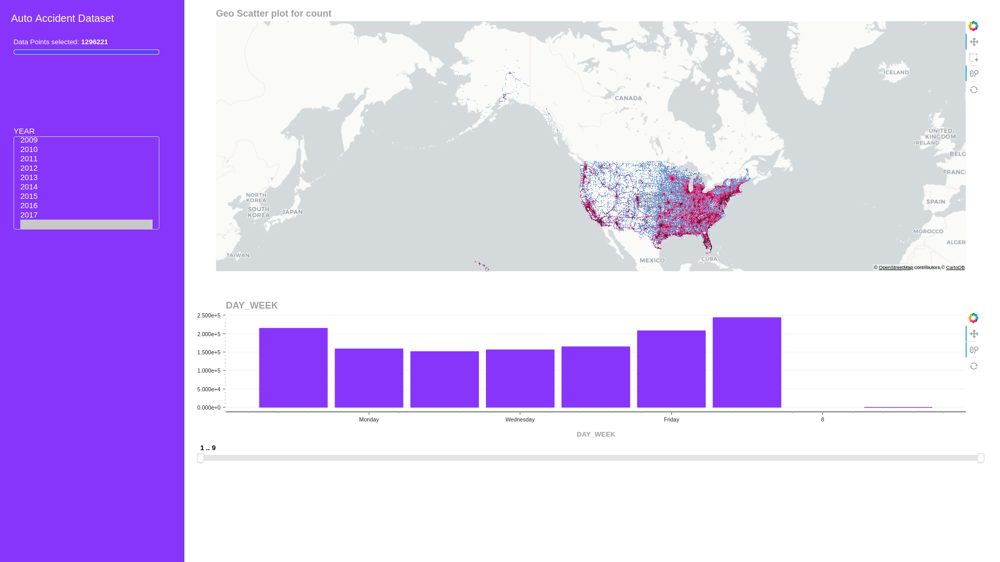

In [14]:
await d.preview()

## Export the queried data into a dataframe

In [13]:
queried_df = d.export()

no querying done, returning original dataframe
